## Double Pendulum

Generalised coordinates :
$$
P(\theta_1,\theta_2)
$$
Cartesian coordinates (pendulum 1) :
$$
\begin{cases}
x_1=l_1\sin\theta_1\\
y_1=-l_1\cos\theta_1
\end{cases}
$$
Cartesian coordinates (pendulum 2) :
$$
\begin{cases}
x_2=l_1\sin\theta_1+l_2\sin\theta_2\\
y_2=-(l_1\cos\theta_1+l_2\cos\theta_2)
\end{cases}
$$
---

Newton's Laws :
$$
\begin{align}
(m_1+m_2)l_1\ddot{\theta}_1+m_2l_2\ddot{\theta}_2\cos(\theta_2-\theta_1)&=m_2l_2\dot{\theta}_2^2\sin(\theta_2-\theta_1)-(m_1+m_2)g\sin\theta_1\\
l_2\ddot{\theta}+l_1\ddot{\theta}_1\cos(\theta_2-\theta_1)&=-l_1\dot{\theta}_1^2\sin(\theta_2-\theta_1)-g\sin\theta_2
\end{align}
$$
In matrix form :
$$
A\,\vec{\ddot{\theta}}=\vec{b}
$$
$$
\text{where}\quad
\begin{cases}
\begin{align*}
\vec{\ddot{\theta}}&=\begin{bmatrix}
\ddot{\theta}_1\\
\ddot{\theta}_2
\end{bmatrix},\\\\
A &= \begin{bmatrix}
(m_1+m_2)l_1 & m_2l_2\cos(\theta_2-\theta_1) \\
l_2 & l_1\cos(\theta_2-\theta_1)
\end{bmatrix},\\\\
\vec{b} &= \begin{bmatrix}
m_2l_2\dot{\theta}_2^2\sin(\theta_2-\theta_1)-(m_1+m_2)g\sin\theta_1\\
-l_1\dot{\theta}_1^2\sin(\theta_2-\theta_1)-g\sin\theta_2
\end{bmatrix}.
\end{align*}
\end{cases}
$$


In [6]:
# 1. Helper functions

# Matrix b
def b1(theta1, theta2, v_theta2):
    return m2 * l2 * abs(v_theta2 ** 2) * np.sin(theta2 - theta1) - (m1 + m2) * g * np.sin(theta1)

def b2(theta1, theta2, v_theta1):
    return -l1 * abs(v_theta1 ** 2) * np.sin(theta2 - theta1) - g * np.sin(theta2)

# Matrix A
def A11():
    return (m1 + m2) * l1

def A12(theta1, theta2):
    return m2 * l2 * np.cos(theta2 - theta1)

def A21():
    return l1 * np.cos(theta2 - theta1)

def A22(theta1, theta2):
    return l2

# Cartesian Pendulum 1
def x_bob1(theta1):
    return l1 * np.sin(theta1)

def y_bob1(theta1):
    return -l1 * np.cos(theta1)

# Cartesian Pendulum 2
def x_bob2(theta1, theta2):
    return l1 * np.sin(theta1) + l2 * np.sin(theta2)

def y_bob2(theta1, theta2):
    return -(l1 * np.cos(theta1) + l2 * np.cos(theta2))

In [7]:
# 2. Calculates arrays of data points
import numpy as np
from scipy.linalg import solve

# Parameters
m1 = 1
m2 = 1
l1 = 1
l2 = 1
g = 9.81

# Initial conditions
theta1 = -65 * np.pi / 180 # 45 degrees
theta2 = 155 * np.pi / 180 # 45 degrees
v_theta1 = 0
v_theta2 = 0
A = np.array([[A11(), A12(theta1, theta2)],
    [A21(), A22(theta1, theta2)]])
b = np.array([b1(theta1, theta2, v_theta2), b2(theta1, theta2, v_theta1)])
a_theta = solve(A, b)

# Arrays to keep x and y values
x1 = [x_bob1(theta1)] # Bob 1
y1 = [y_bob1(theta1)]
x2 = [x_bob2(theta1, theta2)] # Bob 2
y2 = [y_bob2(theta1, theta2)]

# Keep for animation
i_theta1 = theta1
i_theta2 = theta2

# Loop
i = 1
dt = 0.05 # Time divison
sec = 10
total_i = int(sec/dt)

while i < total_i:
    # Update angular velocity
    v_theta1 += a_theta[0] * dt
    v_theta2 += a_theta[1] * dt

    # Update angle
    theta1 += v_theta1 * dt
    theta2 += v_theta2 * dt

    # Append new x and y coordinates
    x1.append(x_bob1(theta1)) # Bob 1
    y1.append(y_bob1(theta1))
    x2.append(x_bob2(theta1, theta2)) # Bob 2
    y2.append(y_bob2(theta1, theta2))

    # Update angular velocity for next iteration
    A = np.array([[A11(), A12(theta1, theta2)],
                  [A21(), A22(theta1, theta2)]])
    b = np.array([b1(theta1, theta2, v_theta2), b2(theta1, theta2, v_theta1)])
    a_theta = solve(A, b)

    # Update iteration count
    i += 1


In [8]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D
from IPython.display import HTML

# Plot style
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['font.family'] = "Times New Roman"
plt.rcParams['figure.dpi'] = 200

# Create plots
fig, ax = plt.subplots()

# Customize axes
ax.set_title(r"Double Pendulum Simulation")
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_xlim(-3, 3)
ax.set_ylim(-3, 1)
ax.axhline(y=0, ls=':', lw=0.5, color='black')
ax.axvline(x=0, ls=':', lw=0.5, color='black')

# Pendulum 1
line1, = ax.plot([], [], c='black', lw=0.5, ls='--')
scat1 = ax.scatter([], [], c='r', s=10, label=f'Pendulum 1')

# Pendulum 2
line2, = ax.plot([], [], c='black', lw=0.5, ls='--')
scat2 = ax.scatter([], [], c='b', s=10, label=f'Pendulum 2')

# Extra legends (dummy handles with no actual plot)
info_labels = [
    Line2D([], [], color='none', label=f'$\\ell_1 = {l1}$'),
    Line2D([], [], color='none', label=f'$\\ell_2 = {l2}$'),
    Line2D([], [], color='none', label=f'$m_1 = {m1}$'),
    Line2D([], [], color='none', label=f'$m_2 = {m2}$'),
    Line2D([], [], color='none', label=f'$\\theta_1 = {180 * i_theta1 / np.pi:.2f}\\,^\\circ$'),
    Line2D([], [], color='none', label=f'$\\theta_2 = {180 * i_theta2 / np.pi:.2f}\\,^\\circ$'),
]

# Legends
ax.legend(handles=[scat1, scat2] + info_labels, fontsize='xx-small', frameon=True)

def update(frame):
    # For each frame, update the data stored on each artist

    # Line (string)
    line1.set_data([0, x1[frame]], [0, y1[frame]])
    line2.set_data([x1[frame], x2[frame]], [y1[frame], y2[frame]])
    
    # Scatter
    data1 = np.stack([x1[frame], y1[frame]]).T
    data2 = np.stack([x2[frame], y2[frame]]).T
    scat1.set_offsets(data1)
    scat2.set_offsets(data2)

    return (scat1, scat2)

ani = animation.FuncAnimation(fig=fig, func=update, frames=len(x1), interval=dt*1000, blit=True)

# PLay the animation
plt.close() # Hide extra image
HTML(ani.to_jshtml()) # Display inline

NameError: name 'l1' is not defined

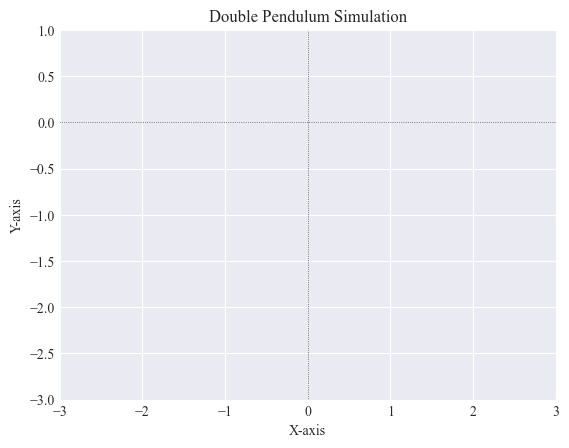

In [4]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D
from IPython.display import HTML

# Plot style
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['font.family'] = "Times New Roman"
plt.rcParams['figure.dpi'] = 100

# Create plots
fig, ax = plt.subplots()

# Customize axes
ax.set_title(r"Double Pendulum Simulation")
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_xlim(-3, 3)
ax.set_ylim(-3, 1)
ax.axhline(y=0, ls=':', lw=0.5, color='black')
ax.axvline(x=0, ls=':', lw=0.5, color='black')

# Pendulum 1
line1, = ax.plot([], [], c='darkgreen', lw=0.5, ls='--')
line3, = ax.plot([], [], c='red', lw=0.5, ls='--')
scat1 = ax.scatter([], [], c='r', s=10, label=f'Pendulum 1')

# Pendulum 2
line2, = ax.plot([], [], c='purple', lw=0.5, ls='--')
line4, = ax.plot([], [], c='blue', lw=0.5, ls='--')
scat2 = ax.scatter([], [], c='b', s=10, label=f'Pendulum 2')

# Extra legends (dummy handles with no actual plot)
info_labels = [
    Line2D([], [], color='none', label=f'$\\ell_1 = {l1}$'),
    Line2D([], [], color='none', label=f'$\\ell_2 = {l2}$'),
    Line2D([], [], color='none', label=f'$m_1 = {m1}$'),
    Line2D([], [], color='none', label=f'$m_2 = {m2}$'),
    Line2D([], [], color='none', label=f'$\\theta_1 = {180 * i_theta1 / np.pi:.2f}\\,^\\circ$'),
    Line2D([], [], color='none', label=f'$\\theta_2 = {180 * i_theta2 / np.pi:.2f}\\,^\\circ$'),
]

# Legends
ax.legend(handles=[scat1, scat2] + info_labels, fontsize='xx-small', frameon=True)

def update(frame):
    # For each frame, update the data stored on each artist

    # Line (string)
    line1.set_data([0, x1[frame]], [0, y1[frame]])
    line2.set_data([x1[frame], x2[frame]], [y1[frame], y2[frame]])

    # Line (tracing)
    line3.set_data(x1[:frame], y1[:frame])
    line4.set_data(x2[:frame], y2[:frame])
    
    # Scatter
    data1 = np.stack([x1[frame], y1[frame]]).T
    data2 = np.stack([x2[frame], y2[frame]]).T
    scat1.set_offsets(data1)
    scat2.set_offsets(data2)

    # Return all modified artists
    return line1, line2, line3, line4, scat1, scat2

ani = animation.FuncAnimation(fig=fig, func=update, frames=len(x1), interval=dt*1000, blit=True)

# Play the animation
plt.close() # Hide extra image
HTML(ani.to_jshtml()) # Display inline
# ani.save('pendulum1.gif', writer=animation.PillowWriter(fps=1/dt), dpi=200)